In [119]:
import myosuite
import gym
import skvideo.io
import numpy as np
import os
import imageio
import tqdm
import time

In [120]:
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width = 400):

  video_file = open(video_path, "r+b").read()

  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video autoplay width={video_width} controls><source src="{video_url}"></video>""")


In [121]:
env = gym.make('CenterReachOut-v0')

<h2> Create an A matrix with T x N (time x mean firing rate)

<h3> Get Policy mjrl

In [4]:
policy = "./policies/seed_42/best_policy.pickle" #Change the folder to the policy location

import pickle
# load policy
pi = pickle.load(open(policy, 'rb'))


# Get Policy SB3

In [ ]:
from stable_baselines3 import PPO
from sb3_contrib import RecurrentPPO

model = PPO.load("MLP-w-feedback-w-reward", env=env)
#model = RecurrentPPO.load("RNN-wo-feedback-full-reward", env=env)

ValueError: Observation spaces do not match: Box(-10.0, 10.0, (7,), float32) != Box(-10.0, 10.0, (128,), float32)

<h2> Setup data collection for mjrl policy </h2>

In [169]:
# Use sleep if you want to examine certain steps during the episodes
from time import sleep
import torch
frames = [] 

TotalNeuralData = []
TotalMuscleActData = []
TotalFiberJointData = []
TotalFiberData = []
TotalFiberLengthData = []
TotalFiberVelocityData = []
TotalJointData = []

total_reward = 0

# This is the number of samples per condition
num_samples = 100
steps = 13
ep_num = 1


for x in range(num_samples):
  NeuralData = {}
  MuscleActData = {}
  FiberJointData = {}
  FiberData = {}
  FiberLengthData = {}
  FiberVelocityData = {}
  JointData = {}
  conditions = {}

  conditions_seen = set()   # instead of a dict

  for n in range(30):
    obs = env.reset()

    # use (x, y) rounded to avoid float-equality issues
    obj = np.copy(env.obs_dict['obj_pos'])
    condition_key = (round(float(obj[0]), 4), round(float(obj[1]), 4))


    if condition_key in conditions_seen:
        continue

    conditions_seen.add(condition_key)

    timestep = 0
    done = False

    # use the same key for your per-condition data dicts
    NeuralData[condition_key] = []
    MuscleActData[condition_key] = []
    FiberJointData[condition_key] = []
    FiberData[condition_key] = []
    FiberLengthData[condition_key] = []
    FiberVelocityData[condition_key] = []
    JointData[condition_key] = []
    
    # --- NEW: reset RNN state at the start of each episode ---
    lstm_states = None
    episode_start = np.array([True])  # tells the LSTM this is a fresh episode


    for ac_num in range(steps):
        timestep += 0.05
        frame = env.sim.renderer.render_offscreen(width=400, height=400, camera_id=1)
        frames.append(frame)

        o = env.get_obs()
        #action, _ = pi.get_action(o)
        action, lstm_states = model.predict(o,
                state=lstm_states,
                episode_start=episode_start,
                deterministic=True,  # or False if you want stochastic rollouts
            )
        
        # For LSTM (Both layers)
        #NeuralData[condition_key].append(np.concatenate((pi.show_activations()[0][0][0].detach().numpy(),pi.show_activations()[1][0][0].detach().numpy())))
        # For LSTM (Only the recurrent layer)
        #NeuralData[condition_key].append(pi.show_activations()[0].detach().numpy()[0][0])
        NeuralData[condition_key].append(#model.policy.activations[0][0].detach().cpu().numpy().ravel())
              np.concatenate([
                  model.policy.activations[0][0].detach().cpu().numpy().ravel(),  # LSTM first layer
                  model.policy.activations[1][0].detach().cpu().numpy().ravel(),  # Actor MLP latent
                  #model.policy.activations[0][0][0][0].detach().cpu().numpy() # LSTM Hidden States
              ], axis=0)
          )
        # NeuralData[condition_key].append(
        #     np.concatenate((pi.show_activations()["layer_0"][0],
        #                     pi.show_activations()["layer_1"][0]))
        # )
        MuscleActData[condition_key].append(np.copy(env.obs_dict['act']))
        FiberJointData[condition_key].append(
            np.concatenate((
                np.copy(env.obs_dict['hand_qpos']),
                np.copy(env.obs_dict['hand_qvel']),
                env.sim.data.actuator_length[:].copy(),
                env.sim.data.actuator_velocity[:].copy()
            ))
        )
        JointData[condition_key].append(
            np.concatenate((
                np.copy(env.obs_dict['hand_qpos']),
                np.copy(env.obs_dict['hand_qvel'])
            ))
        )
        FiberData[condition_key].append(
            np.concatenate((env.sim.data.actuator_length[:].copy(),
                            env.sim.data.actuator_velocity[:].copy()))
        )
        FiberLengthData[condition_key].append(
            env.sim.data.actuator_length[:].copy()
)
        FiberVelocityData[condition_key].append(
                            env.sim.data.actuator_velocity[:].copy()
        )

        obs, reward, done, info = env.step(action)
        total_reward += reward
        
        # --- NEW: update episode_start for the *next* step ---
        episode_start = np.array([done], dtype=bool)

    if len(conditions_seen) == 8:
        break
    ep_num += 1
  
  TotalNeuralData.append(NeuralData)
  TotalMuscleActData.append(MuscleActData)
  TotalFiberJointData.append(FiberJointData)
  TotalFiberLengthData.append(FiberLengthData)
  TotalFiberVelocityData.append(FiberVelocityData)
  TotalJointData.append(JointData)
  TotalFiberData.append(FiberData)

            
env.close()

os.makedirs('videos', exist_ok=True)
video_path = 'videos/test_policy.mp4'
# make a local copy
imageio.mimsave(video_path, frames, fps=30)
show_video('videos/test_policy.mp4')

In [170]:
def average_data(TotalData):
    averaged_data = {}
    
    # Iterate over all episodes
    for episode_data in TotalData:
        for condition, values in episode_data.items():
            # Convert to NumPy arrays for numerical operations
            values = np.array(values)

            if condition not in averaged_data:
                averaged_data[condition] = []

            averaged_data[condition].append(values)

    # Compute the mean for each condition
    for condition in averaged_data:
        averaged_data[condition] = np.mean(averaged_data[condition], axis=0)

    # Re-map keys from conditions to sequential integers (0, 1, 2, ...)
    new_keys = {old_key: new_index for new_index, old_key in enumerate(sorted(averaged_data.keys()))}
    averaged_data = {new_keys[old_key]: values for old_key, values in averaged_data.items()}

    return averaged_data


# Compute averages
NeuralData = average_data(TotalNeuralData)
MuscleActData = average_data(TotalMuscleActData)
FiberJointData = average_data(TotalFiberJointData)
FiberLengthData = average_data(TotalFiberLengthData)
FiberVelocityData = average_data(TotalFiberVelocityData)
FiberData = average_data(TotalFiberData)
JointData = average_data(TotalJointData)

In [171]:
print(f"Neural Data: {NeuralData[0]} \n length: {len(NeuralData[0][2])}") # 512 Neurons
print(f"Muscle Actuator Data: {MuscleActData[1]}\n length: {len(MuscleActData[1])}") # 63 Muscles
print(f"Fiber/Joint Angle/Joint Velocity Data: {FiberJointData[1]} \n length: {len(FiberJointData[1])}") # 63 muscles + 44 joints
print(f"Fiber Length/Velocity Data: {FiberData[1]} \n length: {len(FiberData[1])}") # 63 muscles + 44 joints
print(f"Joint Angle/Velocity Data: {JointData[1]} \n length: {len(JointData[1])}") # 63 muscles + 16 joints
print(f"Fiber Length Data: {FiberLengthData[1]} \n length: {len(FiberLengthData[1])}") # 63 muscles + 44 joints
print(f"Fiber Velocity Data: {FiberVelocityData[1]} \n length: {len(FiberVelocityData[1])}") # 63 muscles + 44 joints

Neural Data: [[-0.4923 -0.0875  0.0077 ... -0.9991  0.9968 -0.9809]
 [-0.0733  0.5373  0.525  ...  0.8024  1.     -1.    ]
 [-0.2771 -0.2397 -0.387  ... -0.9981  1.     -1.    ]
 ...
 [ 0.0645  0.0965 -0.578  ... -1.      1.      1.    ]
 [ 0.1185  0.1086 -0.5628 ... -1.      1.      1.    ]
 [ 0.1759  0.1385 -0.5471 ... -1.      0.9998  1.    ]] 
 length: 256
Muscle Actuator Data: [[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
  0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
  0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
  0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
  0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
  0.0000e+00 0.0000e+00 0.0000e+00]
 [7.8600e-01 7.8600e-01 5.4941e-04 7.8600e-01 7.8600e-01 5.4941e-04
  5.4941e-04 5.4941e-04 5.4941e-04 5.4941e-04 5.4941e-04 7.8600e-01
  7.8600e-01 5.4941e-04 5.4941e-04 7.8600e-01 5.4941e-04 5.4941e-04
  5.4941e-04 5.4941e-04 5.4941e-04 

In [172]:
import scipy.io

time_steps = 13
num_conditions = 8

# Create the `times` array and ensure it's double precision
times =  np.arange(0, time_steps*0.02, 0.02).reshape(-1, 1)
    
data = [NeuralData, MuscleActData, FiberJointData, FiberData, FiberLengthData, FiberVelocityData, JointData]
matrices = []

for x in range(len(data)): # 3 Matrices
    data_struct = np.empty((num_conditions,), dtype=[('A', 'O'), ('times', 'O')])

    for n in range(num_conditions):
        data_struct['A'][n] = data[x][n] 
        data_struct['times'][n] = times  

    
    matrices.append(data_struct)
    
# Save the structured data to a .mat file with 'Data' as the matrix name
scipy.io.savemat('./jPCAData/MLP_w_feedback_neural_data.mat', {'Data': matrices[0]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_muscle.mat', {'Data': matrices[1]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_fiberjoint.mat', {'Data': matrices[2]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_fiber_data.mat', {'Data': matrices[3]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_fiberlength.mat', {'Data': matrices[4]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_fibervelocity.mat', {'Data': matrices[5]})
scipy.io.savemat('./jPCAData/MLP_w_feedback_joint.mat', {'Data': matrices[6]})

<p> We'll basically have 3 matrices A (number of rows = number of steps): <br>
    - Neurons: 512 columns for each neuron <br>
    - Muscle Activity: 63 columns for each muscle actuator intensity <br>
    - Fiber Length/Joint Angle/Velocity: 151 columns for combination of 63 fiber length, 44 joint angle and 44 joint velocities <br>

# Tangling per condition

Formula from Russo et al., 2018 - Neuron

<math xmlns="http://www.w3.org/1998/Math/MathML" id="M1" display="block" overflow="linebreak">
  <mrow>
    <mi>Q</mi>
    <mo>&#x2061;</mo>
    <mrow>
      <mo stretchy="false">(</mo>
      <mi>t</mi>
      <mo stretchy="false">)</mo>
    </mrow>
  </mrow>
  <mo>=</mo>
  <mrow>
    <munder>
      <mtext>max</mtext>
      <mrow>
        <mi>t</mi>
        <mo data-mjx-pseudoscript="true">&#x2032;</mo>
      </mrow>
    </munder>
    <mo>&#x2062;</mo>
    <mfrac>
      <msup>
        <mrow>
          <mo stretchy="false">&#x2016;</mo>
          <mrow>
            <msub>
              <mover accent="true">
                <mi mathvariant="bold-italic">x</mi>
                <mo>&#x2D9;</mo>
              </mover>
              <mi>t</mi>
            </msub>
            <mo>&#x2212;</mo>
            <msub>
              <mover accent="true">
                <mi mathvariant="bold-italic">x</mi>
                <mo>&#x2D9;</mo>
              </mover>
              <mrow>
                <mi>t</mi>
                <mo data-mjx-pseudoscript="true">&#x2032;</mo>
              </mrow>
            </msub>
          </mrow>
          <mo stretchy="false">&#x2016;</mo>
        </mrow>
        <mn>2</mn>
      </msup>
      <mrow>
        <msup>
          <mrow>
            <mo stretchy="false">&#x2016;</mo>
            <mrow>
              <msub>
                <mi mathvariant="bold-italic">x</mi>
                <mi>t</mi>
              </msub>
              <mo>&#x2212;</mo>
              <msub>
                <mi mathvariant="bold-italic">x</mi>
                <mrow>
                  <mi>t</mi>
                  <mo data-mjx-pseudoscript="true">&#x2032;</mo>
                </mrow>
              </msub>
            </mrow>
            <mo stretchy="false">&#x2016;</mo>
          </mrow>
          <mn>2</mn>
        </msup>
        <mo>+</mo>
        <mi>&#x3B5;</mi>
      </mrow>
    </mfrac>
  </mrow>
</math>

In [165]:
import numpy as np

def central_diff(X, dt):
    # X: (T)  ->  returns dX/dt with same shape
    T, D = X.shape
    dX = np.zeros_like(X)
    print(X)
    if T >= 2:
        dX[0]  = (X[1] - X[0]) / dt
        dX[-1] = (X[-1] - X[-2]) / dt
    if T >= 3:
        dX[1:-1] = (X[2:] - X[:-2]) / (2*dt)
    return dX

# normal
def zscore_across_conditions(data_dict):
    # data_dict: {cond_idx: (T, D)}
    allX = np.concatenate([v for v in data_dict.values()], axis=0)  # (Ncond*T, D)
    mu  = allX.mean(axis=0, keepdims=True)
    std = allX.std(axis=0, keepdims=True) + 1e-12
    return {k: (v - mu) / std for k, v in data_dict.items()}

def tangling_curve(X, eps=1e-8):
    # X: (T, D) already z-scored; returns Tvec: (T,)
    T = X.shape[0]
    dX = central_diff(X, dt)  # uses dt from outer scope if you prefer; or pass as arg
    Tvec = np.zeros(T, dtype=np.float64)
    for t in range(T):
        num = np.linalg.norm(dX[t] - dX, axis=1)   # (T,)
        den = np.linalg.norm(X[t]  - X,  axis=1) + eps
        num[t] = 0.0
        den[t] = np.inf
        Tvec[t] = np.max(num / den)
    return Tvec


In [166]:

# ---- Run on your averaged NeuralData ----
dt = 0.05  # seconds (match your collection loop)
NeuralData_z = zscore_across_conditions(NeuralData)  # NeuralData from your average_data()
MuscleActData_z = zscore_across_conditions(MuscleActData) 
FiberJoint_z = zscore_across_conditions(FiberJointData) 
FiberLength_z = zscore_across_conditions(FiberLengthData) 
FiberVelocity_z = zscore_across_conditions(FiberVelocityData) 
Joint_z = zscore_across_conditions(JointData) 

NeuralTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in NeuralData_z.items()}  # each (16,)
NeuralTanglingMean     = np.vstack(list(NeuralTanglingPerCond.values())).mean(axis=0)            # (16,)
NeuralTanglingSEM      = np.vstack(list(NeuralTanglingPerCond.values())).std(axis=0) / np.sqrt(len(NeuralTanglingPerCond))

MuscleTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in MuscleActData_z.items()}  # each (16,)
MuscleTanglingMean     = np.vstack(list(MuscleTanglingPerCond.values())).mean(axis=0)            # (16,)
MuscleTanglingSEM      = np.vstack(list(MuscleTanglingPerCond.values())).std(axis=0) / np.sqrt(len(MuscleTanglingPerCond))

# FiberJointTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in FiberJoint_z.items()}  # each (16,)
# FiberJointTanglingMean     = np.vstack(list(FiberJointTanglingPerCond.values())).mean(axis=0)            # (16,)
# FiberJointTanglingSEM      = np.vstack(list(FiberJointTanglingPerCond.values())).std(axis=0) / np.sqrt(len(FiberJointTanglingPerCond))

# FiberLengthTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in FiberLength_z.items()}  # each (16,)
# FiberLengthTanglingMean     = np.vstack(list(FiberLengthTanglingPerCond.values())).mean(axis=0)            # (16,)
# FiberLengthTanglingSEM      = np.vstack(list(FiberLengthTanglingPerCond.values())).std(axis=0) / np.sqrt(len(FiberJointTanglingPerCond))

# FiberVelocityTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in FiberVelocity_z.items()}  # each (16,)
# FiberVelocityTanglingMean     = np.vstack(list(FiberVelocityTanglingPerCond.values())).mean(axis=0)            # (16,)
# FiberVelocityTanglingSEM      = np.vstack(list(FiberVelocityTanglingPerCond.values())).std(axis=0) / np.sqrt(len(FiberJointTanglingPerCond))

# JointTanglingPerCond = {c: tangling_curve(X, eps=1e-8) for c, X in Joint_z.items()}  # each (16,)
# JointTanglingMean     = np.vstack(list(JointTanglingPerCond.values())).mean(axis=0)            # (16,)
# JointTanglingSEM      = np.vstack(list(JointTanglingPerCond.values())).std(axis=0) / np.sqrt(len(FiberJointTanglingPerCond))


[[ 0.2182  0.7855  0.7386 ... -0.4597 -1.9507 -1.1776]
 [-0.6068 -0.5777  0.2985 ... -0.3461 -2.0397 -1.3242]
 [ 1.2166 -1.6957  1.5167 ... -0.4621 -2.0411  0.2109]
 ...
 [ 1.1268  0.7373  0.7658 ... -0.4623  0.5778  1.0597]
 [ 1.2402  0.8283  0.6369 ... -0.4623  0.5791  1.0597]
 [ 1.4015  0.9684  0.5502 ... -0.4623  0.5784  1.0597]]
[[-9.8190e-01  5.1125e-01  4.5335e-01 ... -4.1659e-01  1.0351e-01
  -1.2112e+00]
 [-1.5371e+00  2.0927e-01  1.2295e+00 ...  2.4635e+00 -2.6649e-01
  -1.3280e+00]
 [-1.1596e+00 -2.7262e-02  1.0988e+00 ...  2.4616e+00  1.4455e-01
  -1.3280e+00]
 ...
 [-2.3374e-03  5.4475e-01 -4.1040e-01 ... -4.6231e-01  5.8723e-01
   1.0563e+00]
 [-4.9062e-01  2.4194e-01 -7.1716e-02 ... -4.6231e-01  5.9053e-01
   1.0584e+00]
 [-4.4644e-01  1.2538e-01  8.2276e-02 ... -4.6232e-01  5.9008e-01
   1.0591e+00]]
[[-2.0139  0.0993  0.1355 ... -0.1633  0.5903 -1.2265]
 [ 0.2271  0.423   1.9402 ...  2.4641  0.5592 -1.328 ]
 [-0.3441 -0.0684  0.7452 ...  2.4255  0.4294 -1.328 ]
 ...
 [

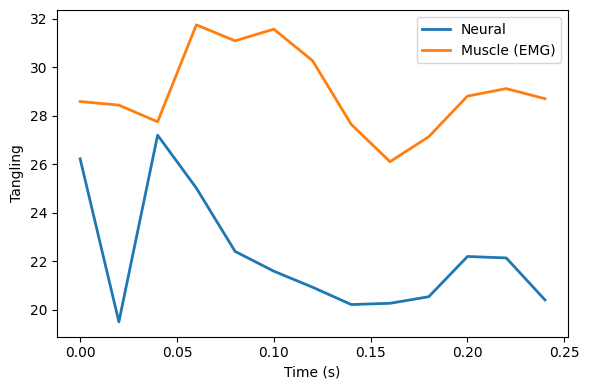

In [167]:
import matplotlib.pyplot as plt
t = np.arange(13) * 0.02  # seconds

plt.figure(figsize=(6,4))
plt.plot(t, NeuralTanglingMean, label='Neural', linewidth=2)
plt.plot(t, MuscleTanglingMean, label='Muscle (EMG)', linewidth=2)
# plt.plot(t, FiberJointTanglingMean, label='Fibers and Joints', linewidth=2)
# plt.plot(t, FiberLengthTanglingMean, label='Fiber Length', linewidth=2)
# plt.plot(t, FiberVelocityTanglingMean, label='Fiber Velocity', linewidth=2)
# plt.plot(t, JointTanglingMean, label='Joints', linewidth=2)
plt.xlabel('Time (s)')
plt.ylabel('Tangling')
plt.legend()
plt.tight_layout()
plt.show()

# Down Sampling
<p> Since the amount of neurons, muscles and fiber/joints are not equal, we want to make that we account for that size difference. 

In [ ]:
print(len(data[2][0][0]))
# neural data: len(data[0][ep_1, ep_2 ... ep108][act_1, act_2...act16]) = 512
# muscle data: len(data[1][ep_1, ep_2 ... ep108][act_1, act_2...act16]) = 63
# fiber data: len(data[2][ep_1, ep_2 ... ep108][act_1, act_2...act16]) = 214

test_neuraldata = list(data[0].values())
test_muscledata = list(data[1].values())
test_fiberdata = list(data[2].values())

In [ ]:
def downsample(dataset):
    downsampled_dataset = []
    for episode in dataset:
        downsampled_episode = []
        for activity in episode:
            if len(activity) > 63:
                step = len(activity) // 63
                downsampled_activity = activity[::step][:63]  
            else:
                downsampled_activity = activity 
            downsampled_episode.append(downsampled_activity)
        downsampled_dataset.append(downsampled_episode)
    return downsampled_dataset

In [ ]:
downsampled_Neural_data = {}

downsampled_Neural_data = downsample(test_neuraldata)

downsampled_Neural_data = {index: value for index, value in enumerate(downsampled_Neural_data)}

In [ ]:
downsampled_FiberJoint_data = {}

downsampled_FiberJoint_data = downsample(test_fiberdata)
    
downsampled_FiberJoint_data = {index: value for index, value in enumerate(downsampled_FiberJoint_data )}

print(len(downsampled_Neural_data[0][0]))

Create Matrix

In [ ]:
import numpy as np
import scipy.io

time_steps = 16

# Create the `times` array and ensure it's double precision
times =  np.arange(0, time_steps*0.02, 0.02).reshape(-1, 1)
    
data = [downsampled_Neural_data, MuscleActData, downsampled_FiberJoint_data]
matrices = []

for x in range(7): # 3 Matrices
    data_struct = np.empty((ep_num,), dtype=[('A', 'O'), ('times', 'O')])

    for n in range(ep_num):
        data_struct['A'][n] = data[x][n] 
        data_struct['times'][n] = times  

    
    matrices.append(data_struct)
    
# Save the structured data to a .mat file with 'Data' as the matrix name
scipy.io.savemat('MLP_final_neural_data_downsampled.mat', {'Data': matrices[0]})
scipy.io.savemat('MLP_final_muscle_data_downsampled.mat', {'Data': matrices[1]})
scipy.io.savemat('MLP_final_fiberjoint_data_downsampled.mat', {'Data': matrices[2]})
